### Packages used in the code

In [1]:
# Package for file and folder operations
import os

# Packages for image processing
from PIL import Image # type: ignore
import cv2 # type: ignore

# Package for visualization
import matplotlib.pyplot as plt # type: ignore

# Package for data manipulation
import numpy as np # type: ignore
import pandas as pd # type: ignore

### Parameters

In [2]:
image_folder = "../datasets/prepared_calming_images_small/"

### Data retrieved from AI Large Language Models (LLM) Prompts

In [3]:
rankings = {
    3: [5],
    7: [6,7,9,33,46],
    8: [37,48],
    10: [3,13,19,31,36]
}


keywords = {
    1:['trees', 'path', 'forest', 'greenery', 'nature', 'artwork', 'painting', 'colors', 'landscape', 'scenic'],
    2:['forest', 'trees', 'greenery', 'pathway', 'ferns', 'nature', 'sunlight', 'tranquil', 'woods', 'lush'],
    3:['forest', 'trees', 'green', 'blue', 'painting', 'landscape', 'nature', 'outdoors', 'scenic', 'artwork'],
    4:['forest', 'sunset', 'person', 'sitting', 'trees', 'pathway', 'mountains', 'greenery', 'peaceful', 'nature'],
    5:['forest', 'trees', 'sunlight', 'pathway', 'greenery', 'nature', 'tranquility', 'morning light', 'shadows', 'foliage'],
    6:["roses", "garden", "sunlight", "pathway", "greenery", "blossoms", "peaceful", "nature", "archway", "lush"],
    7:['Mountains', 'Forest', 'Beach', 'Ocean', 'Flowers', 'Sunlight', 'Trees', 'Rocks', 'Waves', 'Sky'],
    8:["forest", "trees", "pathway", "greenery", "nature", "light", "shadows", "tranquil", "outdoors", "scenic"],
    9:["landscape", "painting", "clouds", "sky", "trees", "field", "nature", "outdoors", "scenic", "art"],
    10:["mountains", "forest", "river", "mist", "sunrise", "trees", "reflection", "nature", "landscape", "serenity"],
    11:["sunset", "hills", "lake", "reflection", "trees", "flowers", "clouds", "colorful", "landscape", "artistic"],
    12:['forest', 'river', 'trees', 'nature', 'landscape', 'sunlight', 'greenery', 'tranquil', 'scenic', 'wilderness'],
    13:['mountains', 'trees', 'reflection', 'water', 'sunset', 'colors', 'nature', 'scenic', 'tranquil', 'landscape'],
    14:['birch trees', 'snow', 'autumn leaves', 'river', 'rocks', 'forest', 'nature', 'scenic view', 'tranquility', 'seasonal change'],
    15:['trees', 'clouds', 'blue sky', 'field', 'flowers', 'nature', 'landscape', 'painting', 'artwork', 'scenery'],
    16:['mountains', 'boat', 'lake', 'trees', 'flowers', 'sky', 'clouds', 'nature', 'serenity', 'artwork'],
    17:['trees', 'mountains', 'snow', 'moon', 'forest', 'nature', 'landscape', 'winter', 'pine trees', 'sky'],
    18:['forest', 'river', 'trees', 'mist', 'rocks', 'waterflow', 'greenery', 'nature', 'serenity', 'wilderness'],
    19:['flowers', 'yellow', 'blue', 'painting', 'nature', 'landscape', 'artwork', 'blossom', 'field', 'sky'],
    20:['landscape', 'cliff', 'ocean', 'sky', 'clouds', 'vegetation', 'shoreline', 'blue', 'red-rock', 'scenic'],
    21:['sunset', 'birds', 'sky', 'clouds', 'orange', 'blue', 'silhouette', 'flying', 'nature', 'painting'],
    22:['forest', 'river', 'rocks', 'trees', 'water', 'flowing', 'nature', 'landscape', 'greenery', 'wilderness'],
    23:["mountains", "lake", "reflection", "flowers", "mist", "sunset", "purple", "pink", "serene", "landscape"],
    25:['landscape', 'painting', 'trees', 'building', 'sky', 'clouds', 'fields', 'colors', 'nature', 'art'],
    26:['mountains', 'trees', 'forest', 'pathway', 'clouds', 'sky', 'stone wall', 'greenery', 'landscape', 'nature'],
    29:["landscape", "painting", "trees", "building", "sky", "clouds", "fields", "nature", "colors", "artwork"],

}

### Table creation containing all the data (dataframe format)

In [4]:
# Retrieve and list images from /images/data
image_files = [file for file in os.listdir(image_folder) if file.endswith(".jpg") or file.endswith(".png")]
image_files.sort()

# Create a DataFrame with the image names and paths
dataset = pd.DataFrame(image_files, columns=["image_name"])
dataset["image_path"] = image_folder + dataset["image_name"]
dataset["description"] = None
dataset["keywords"] = None
dataset["id"] = dataset["image_name"].str.split(".").str[0].astype(int)

# Add the calmness ratings
dataset["calmness_rating"] = 9
for key, image_ids in rankings.items():
    dataset.loc[dataset['id'].isin(image_ids), 'calmness_rating'] = key

# Add all the keywords
for key, keywords_list in keywords.items():
    dataset.loc[dataset['id'] == key, 'keywords'] = ', '.join(keywords_list)

# Display the dataset
dataset

,image_name,image_path,description,keywords,id,calmness_rating
0,1.png,../datasets/prepared_calming_images_small/1.png,None,"trees, path, forest, greenery, nature, artwork...",1,9
1,10.png,../datasets/prepared_calming_images_small/10.png,None,"mountains, forest, river, mist, sunrise, trees...",10,9
2,11.png,../datasets/prepared_calming_images_small/11.png,None,"sunset, hills, lake, reflection, trees, flower...",11,9
3,12.png,../datasets/prepared_calming_images_small/12.png,None,"forest, river, trees, nature, landscape, sunli...",12,9
4,13.png,../datasets/prepared_calming_images_small/13.png,None,"mountains, trees, reflection, water, sunset, c...",13,10
5,14.png,../datasets/prepared_calming_images_small/14.png,None,"birch trees, snow, autumn leaves, river, rocks...",14,9
6,15.png,../datasets/prepared_calming_images_small/15.png,None,"trees, clouds, blue sky, field, flowers, natur...",15,9
7,16.png,../datasets/prepared_calming_images_small/16.png,None,"mountains, boat, lake, trees, flowers, sky, cl...",16,9
8,17.png,../datasets/prepared_calming_images_small/17.png,None,"trees, mountains, snow, moon, forest, nature, ...",17,9
9,18.png,../datasets/prepared_calming_images_small/18.png,None,"forest, river, trees, mist, rocks, waterflow, ...",18,9


### Mosaic of all images in my custom dataset

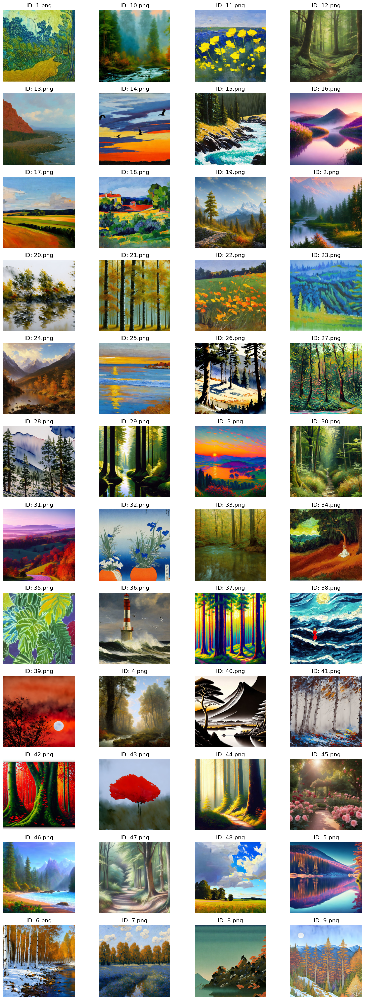

In [5]:
# Function to display mosaic of images with IDs
def display_mosaic(images, ids, rows, cols, figsize=(12, 30)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        ax.axis("off")
        ax.set_title(f"ID: {ids[i]}")
    plt.tight_layout()
    plt.show()

# Load images and IDs
images = [Image.open(image_path) for image_path in dataset["image_path"]]
ids = dataset["image_name"]

# Display mosaic of images with IDs
display_mosaic(images, ids, rows=12, cols=4)


### Creating histograms to looks at trends and patterns

In [6]:
# Function to generate small preview image
def generate_preview(image_path, size=(50, 50)):
    image = cv2.imread(image_path)
    image = cv2.resize(image, size)
    return image

# Function to generate RGB histogram
def generate_histogram(image_path):
    image = cv2.imread(image_path)
    histogram = []
    for i in range(3):  # Iterate over each channel (R, G, B)
        channel_hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        histogram.append(channel_hist)
    return histogram


dataset["preview"] = dataset["image_path"].apply(lambda x: generate_preview(x))
dataset["histogram"] = dataset["image_path"].apply(lambda x: generate_histogram(x))
print("I'm done creating the histograms")

I'm done creating the histograms


images 9+ : 40/48


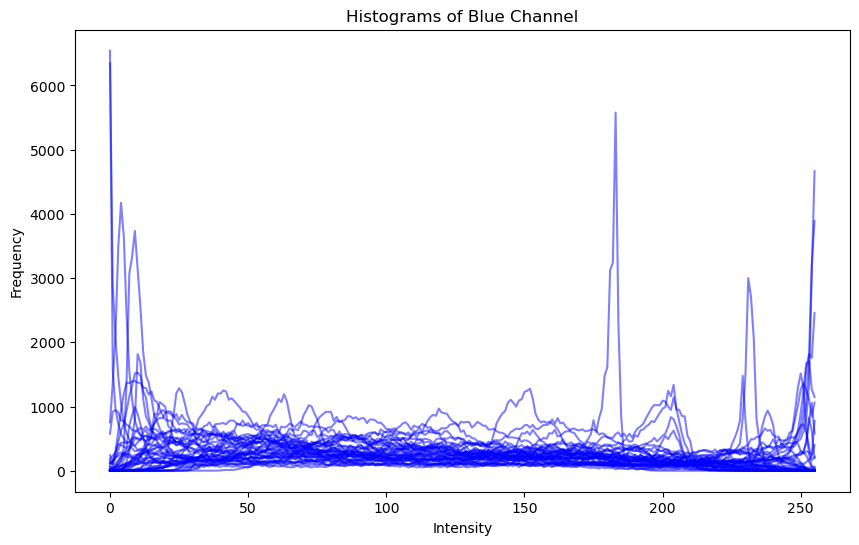

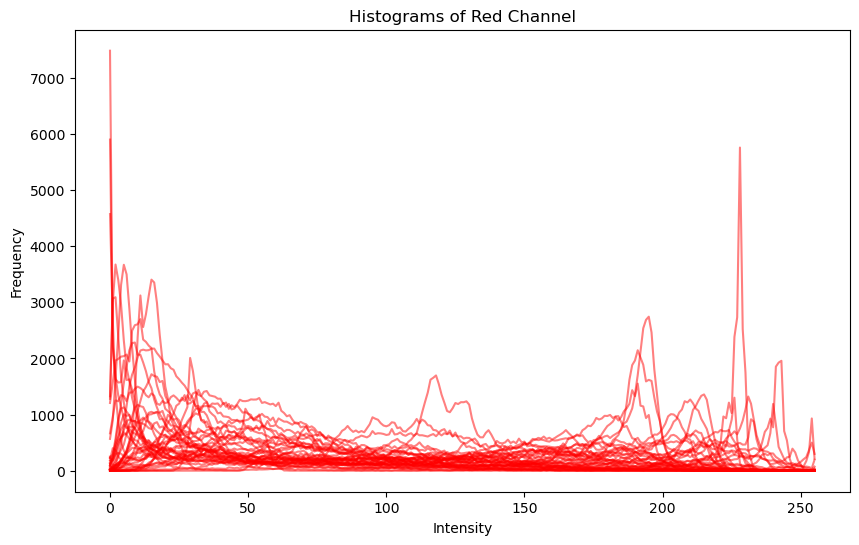

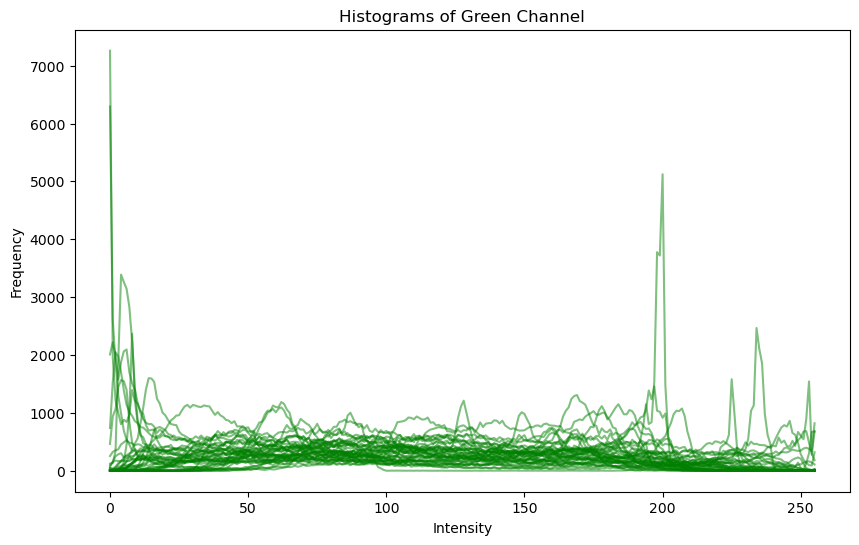

images 9+ : 40/48


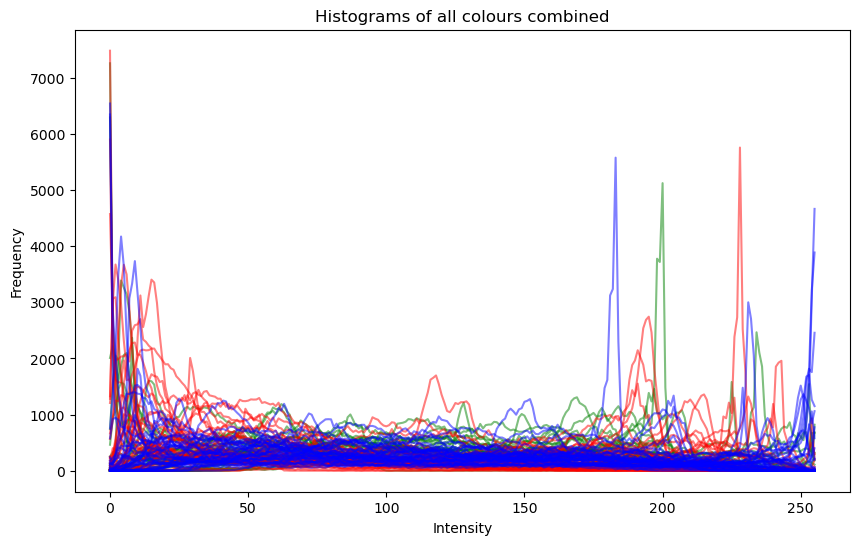

In [7]:
# Create an empty list to store the blue channel histograms
red_histograms = []
green_histograms = []
blue_histograms = []

# Only take the images with calmness ratings of 9 and 10
subset = dataset[dataset['calmness_rating'].isin([9,10])]

# Iterate
for index, row in subset.iterrows():
    # Get the coloured histogram for the current image
    red_hist = row['histogram'][0]
    green_hist = row['histogram'][1]
    blue_hist = row['histogram'][2]

    # Append the blue channel histogram to the list
    red_histograms.append(red_hist)
    green_histograms.append(green_hist)
    blue_histograms.append(blue_hist)


# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the blue channel histograms
for hist in blue_histograms:
    ax.plot(hist, color='blue', alpha=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')

# Set the title of the graph
ax.set_title('Histograms of Blue Channel')

# Show the graph
print("images 9+ : " +  str(len(subset))+"/"+  str(len(dataset)))
plt.show()

# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the red channel histograms
for hist in red_histograms:
    ax.plot(hist, color='red', alpha=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')

# Set the title of the graph
ax.set_title('Histograms of Red Channel')

plt.show()


# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the green channel histograms
for hist in green_histograms:
    ax.plot(hist, color='green', alpha=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')

# Set the title of the graph
ax.set_title('Histograms of Green Channel')

plt.show()


# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the blue channel histograms
for hist in green_histograms:
    ax.plot(hist, color='green', alpha=0.5)
for hist in red_histograms:
    ax.plot(hist, color='red', alpha=0.5)
for hist in blue_histograms:
    ax.plot(hist, color='blue', alpha=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')

# Set the title of the graph
ax.set_title('Histograms of all colours combined')

# Show the graph
print("images 9+ : " +  str(len(subset))+"/"+  str(len(dataset)))
plt.show()


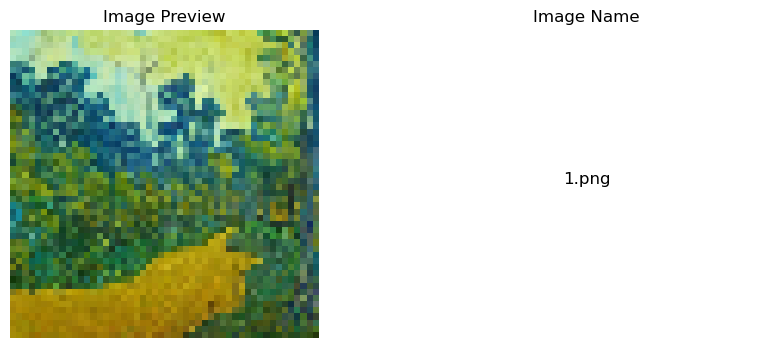

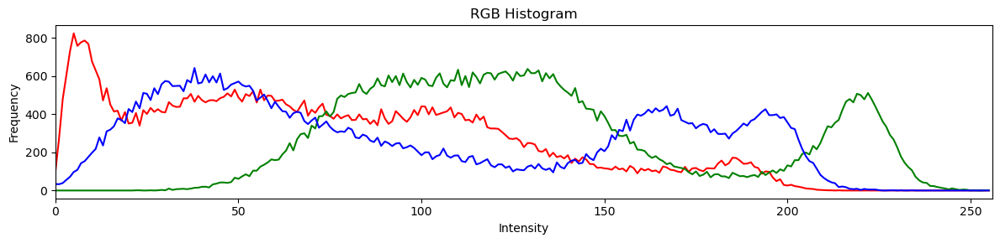

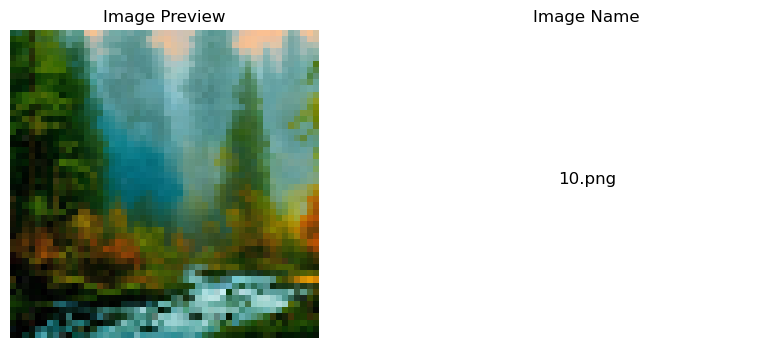

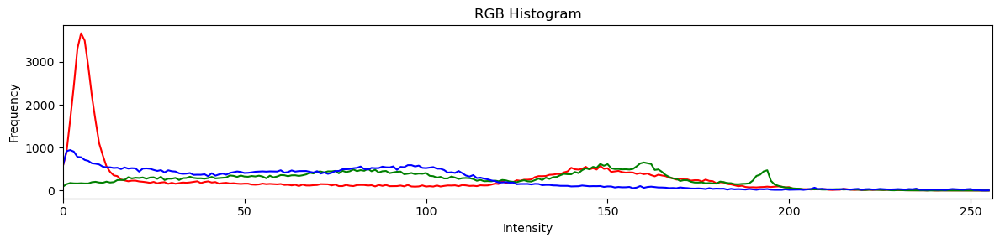

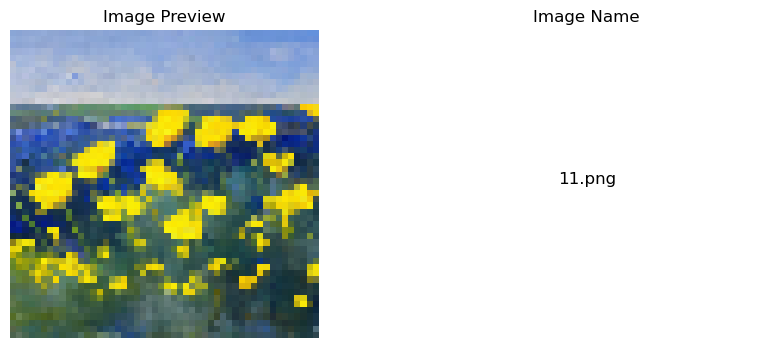

...

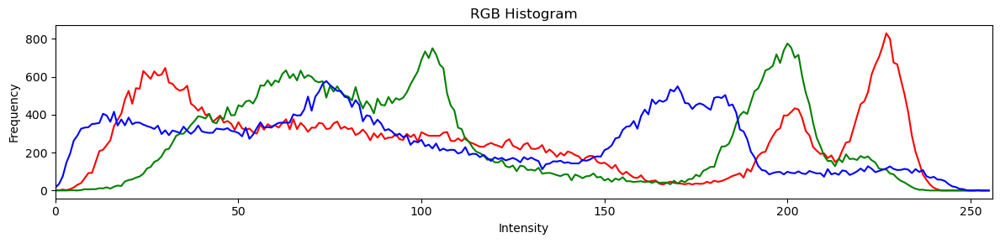

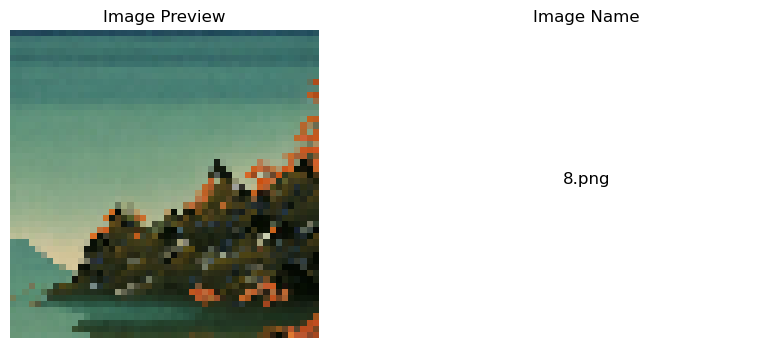

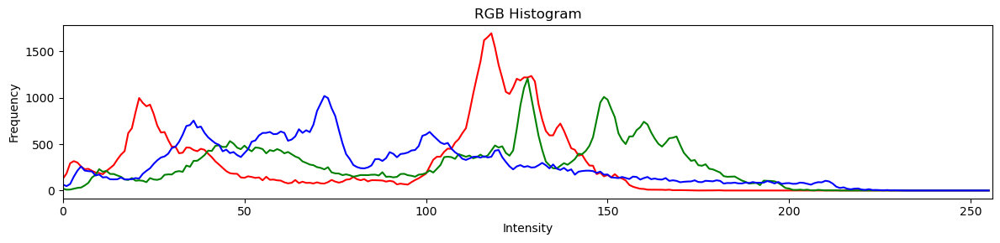

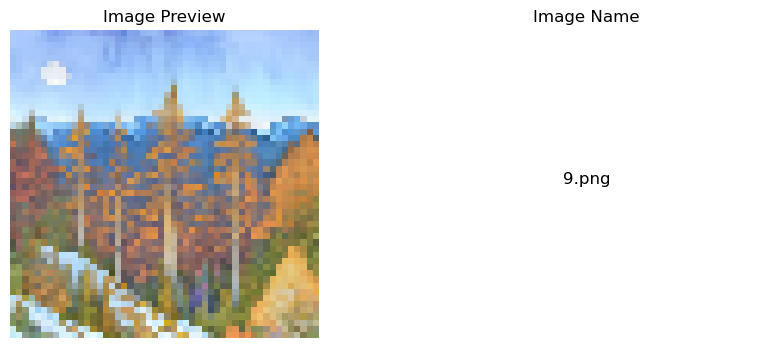

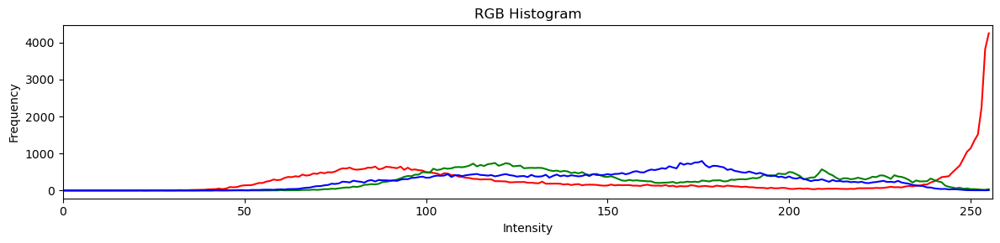

In [8]:
# Plot each line of the dataset
for index, row in dataset.iterrows():
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

    # Plot image preview
    axs[0].imshow(cv2.cvtColor(row['preview'], cv2.COLOR_BGR2RGB))
    axs[0].axis('off')
    axs[0].set_title('Image Preview')

    # Plot image name
    axs[1].text(0.5, 0.5, row['image_name'], fontsize=12, ha='center')
    axs[1].axis('off')
    axs[1].set_title('Image Name')

    plt.figure(figsize=(12, 3))
    plt.title('RGB Histogram')
    colors = ('r', 'g', 'b')
    for i, color in enumerate(colors):
        plt.plot(row['histogram'][i], color=color)
        plt.xlim([0, 256])
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


## Can we find some trends if we select the most calming images ? 

In [9]:
selected_images = [45,30,27,12,7,19]

images 9+ : 6/48


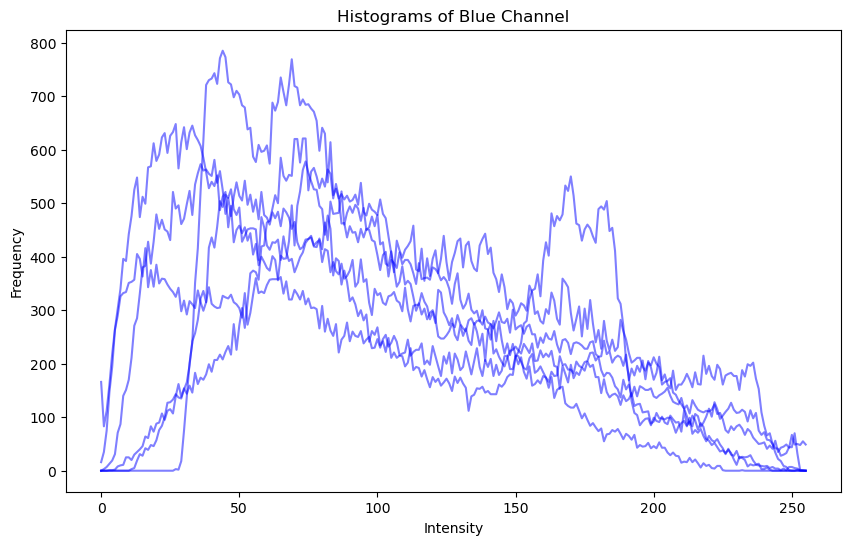

images 9+ : 6/48


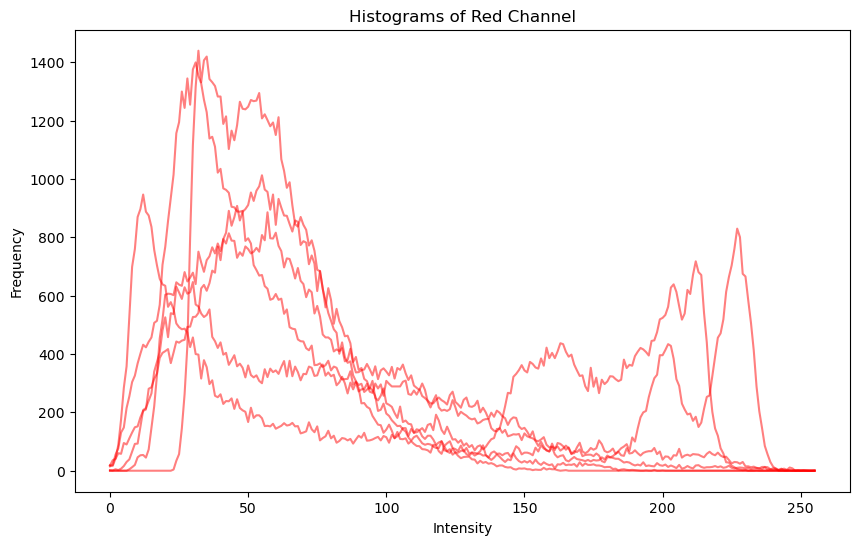

images 9+ : 6/48


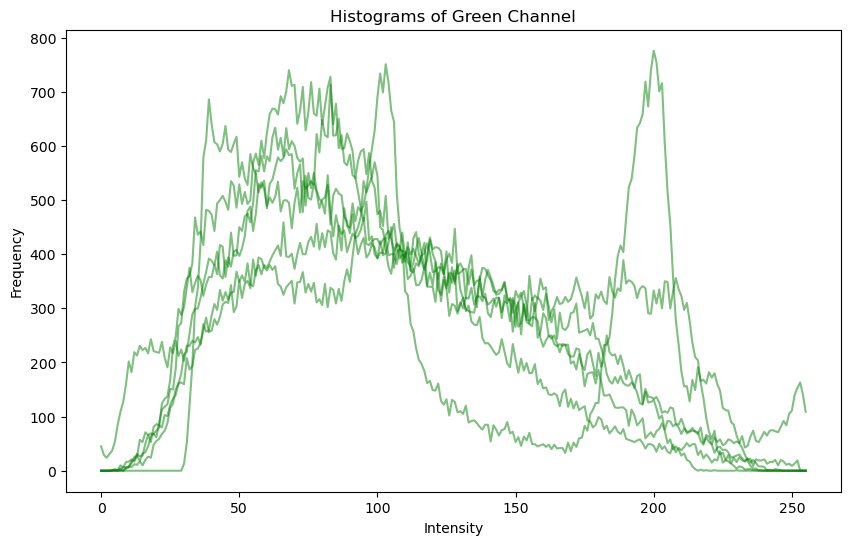

images 9+ : 6/48


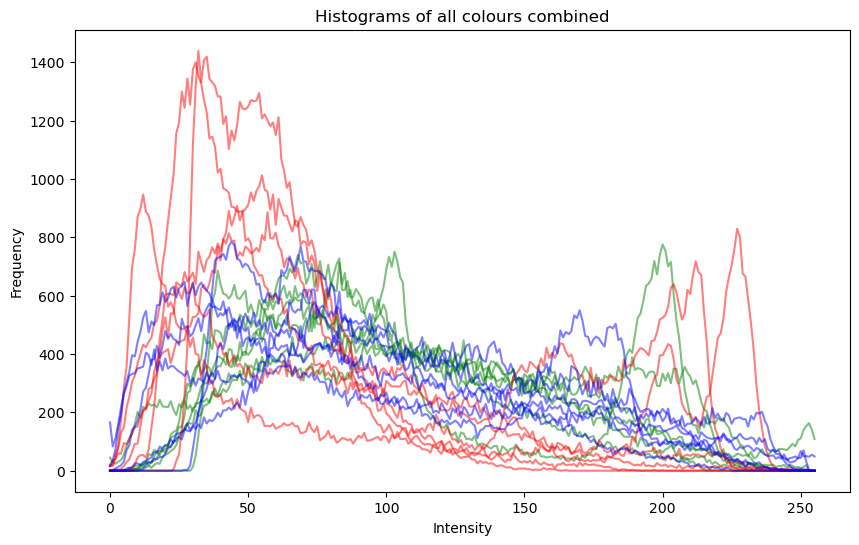

In [10]:
subset = dataset[dataset["id"].isin(selected_images)].reset_index(drop=True)
subset["histogram"] = subset["image_path"].apply(lambda x: generate_histogram(x))


# Create an empty list to store the blue channel histograms
red_histograms = []
green_histograms = []
blue_histograms = []

# Iterate
for index, row in subset.iterrows():
    # Get the coloured histogram for the current image
    red_hist = row['histogram'][0]
    green_hist = row['histogram'][1]
    blue_hist = row['histogram'][2]

    # Append the blue channel histogram to the list
    red_histograms.append(red_hist)
    green_histograms.append(green_hist)
    blue_histograms.append(blue_hist)



# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the blue channel histograms
for hist in blue_histograms:
    ax.plot(hist, color='blue', alpha=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')

# Set the title of the graph
ax.set_title('Histograms of Blue Channel')

# Show the graph
print("images 9+ : " +  str(len(subset))+"/"+  str(len(dataset)))
plt.show()


# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the blue channel histograms
for hist in red_histograms:
    ax.plot(hist, color='red', alpha=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')

# Set the title of the graph
ax.set_title('Histograms of Red Channel')

# Show the graph
print("images 9+ : " +  str(len(subset))+"/"+  str(len(dataset)))
plt.show()

# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the blue channel histograms
for hist in green_histograms:
    ax.plot(hist, color='green', alpha=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')

# Set the title of the graph
ax.set_title('Histograms of Green Channel')

# Show the graph
print("images 9+ : " +  str(len(subset))+"/"+  str(len(dataset)))
plt.show()




# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the blue channel histograms
for hist in green_histograms:
    ax.plot(hist, color='green', alpha=0.5)
for hist in red_histograms:
    ax.plot(hist, color='red', alpha=0.5)
for hist in blue_histograms:
    ax.plot(hist, color='blue', alpha=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')

# Set the title of the graph
ax.set_title('Histograms of all colours combined')

# Show the graph
print("images 9+ : " +  str(len(subset))+"/"+  str(len(dataset)))
plt.show()
